# Check Lightcurve for Solar System Contamination

When collecting time series observations of stars near the ecliptic plane, often solar system objects can wander in and out of the field of view. This in principle could affect a transit or flare searches, either by contaminating the aperture (making the star appear temporilly brighter) or the background (making the star appear temporarily dimmer). We can use `jorbit` and its pre-computed ephemerides to check for the impact of solar system objects on a lightcurve.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time

from jorbit.mpchecker import nearest_asteroid, animate_region

If we want just a quick/easy check if any solar system objects are in the field of view, we can run:

In [2]:
separations, asteroids = nearest_asteroid(
    coordinate=SkyCoord(ra=0 * u.deg, dec=0 * u.deg),
    times=Time("2025-01-01") + np.arange(0, 3, 1 / 24 / 4) * u.day,
    radius=2 * u.arcmin, # roughly ~10x10 TESS pixels, comparable to a TPF
)

This uses the same assumptions baked into the `extra_precision=False` version of the `mpchecker` function, namely a geocentric observer and Newtonian-only gravity. But, it gives us a good first look at what might be happening near our target. `separations` is now a vector of anglular separations to the nearest solar system object, and `asteroids` is a Table of all the asteroid that flew within our radius during the times we checked:

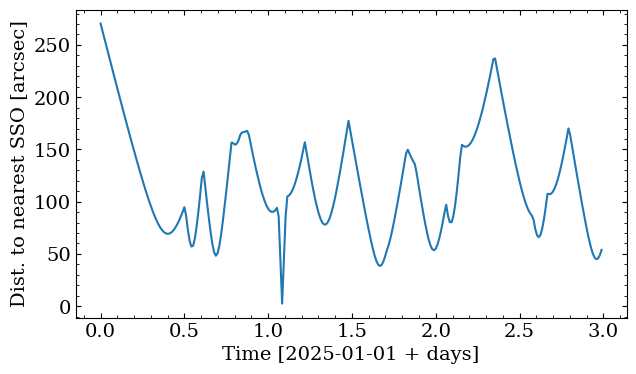

In [3]:
fig, ax = plt.subplots()
ax.plot(np.arange(0, 3, 1 / 24 / 4), separations)
ax.set(xlabel="Time [2025-01-01 + days]", ylabel="Dist. to nearest SSO [arcsec]");

In [4]:
asteroids

Unpacked Name,Packed designation,H,G,Epoch,M,Peri,Node,Incl.,e,n,a,U,Reference,#Obs,#Opp,Arc,rms,Coarse Perts,Precise Perts,Computer,Flags,last obs
str19,str7,str5,str4,str5,str9,str9,str9,str8,str9,str10,str9,str1,str9,str3,str2,str9,str4,str3,str3,str8,str4,str8
(126467) 2002 CZ39,C6467,15.68,0.15,K24AH,177.63623,346.50744,200.09060,13.13048,0.1048344,0.24259019,2.5461690,0,E2025-B02,758,18,2000-2025,0.80,M-v,3Ek,MPCLINUX,0000,20250116
(180961) 2005 MJ35,I0961,17.34,0.15,K24AH,80.24154,181.36581,79.74923,0.03598,0.1921335,0.26351433,2.4095349,0,E2024-XE9,451,18,1998-2024,0.86,M-v,3Ek,MPCLINUX,0000,20241204
(184308) 2005 EY209,I4308,16.51,0.15,K24AH,97.93745,60.76265,201.32134,1.47153,0.0315771,0.22652144,2.6652002,0,E2025-B02,497,18,1998-2025,0.86,M-v,3Ek,MPCLINUX,0000,20250116
(346625) 2008 WK112,Y6625,17.43,0.15,K24AH,349.31396,346.54826,28.75356,1.58481,0.2094776,0.23984754,2.5655424,0,E2024-V47,403,15,2001-2024,0.90,M-v,3Ek,MPCLINUX,0000,20241102
(371405) 2006 RN84,b1405,18.11,0.15,K24AH,327.62996,195.90660,210.51558,0.78700,0.1793995,0.27207344,2.3587321,0,E2024-U19,218,11,2006-2024,0.96,M-v,3Ek,MPCLINUX,0000,20241018
(492869) 2014 QN378,n2869,17.38,0.15,K24AH,38.52496,118.90672,200.28784,5.29848,0.0737444,0.19643148,2.9308617,0,E2024-XE9,116,12,2004-2024,1.04,M-v,3Ek,MPCLINUX,0000,20241204
(610939) 2006 KB148,z0939,17.69,0.15,K24AH,230.34617,301.35642,200.96456,12.22043,0.1055358,0.24057026,2.5604016,0,E2024-UB5,93,8,2006-2024,0.45,M-v,3Ek,MPCLINUX,0000,20241024
2005 UX268,K05UQ8X,20.24,0.15,K24AH,5.24862,319.28423,32.86362,22.75448,0.1123686,0.35994465,1.9572467,9,MPO630349,12,1,1 days,0.51,M-v,3Ek,Pan,2006,20051029
2013 CZ241,K13CO1Z,17.89,0.15,K24AH,118.86322,220.40051,19.20885,5.37139,0.0542028,0.21447109,2.7641199,0,E2024-T78,45,6,2013-2024,0.40,M-v,3Ek,MPCLINUX,0000,20241004


Looks like there was a close approach by something moving rapidly around one day into our time series. To investigate its potential impact on our lightcurve, we can run:

In [5]:
separations, asteroids, coord_table, mag_table, total_mags = nearest_asteroid(
    coordinate=SkyCoord(ra=0 * u.deg, dec=0 * u.deg),
    times=Time("2025-01-01") + np.arange(0, 3, 1 / 24 / 4) * u.day,
    radius=2 * u.arcmin,
    compute_contamination=True,
    observer="geocentric",
)

Note that now we've set `compute_contamination=True` and specified a specific observer, which initiates several extra calculations, again like the `extra_precision=True` version of `mpchecker`. This takes considerably longer (this ~300 point time series takes ~a min on my laptop), but a lot is happening behind the scenes: we're running the initial low precision version to flag all the relevant asteroids, running an N-body simulation to map each one to each moment in our time series, then computing its sky position and estimated magntidue as seen from a particular observer.

We can now look at a time series of the total magnitude of all asteroids in our field of view:

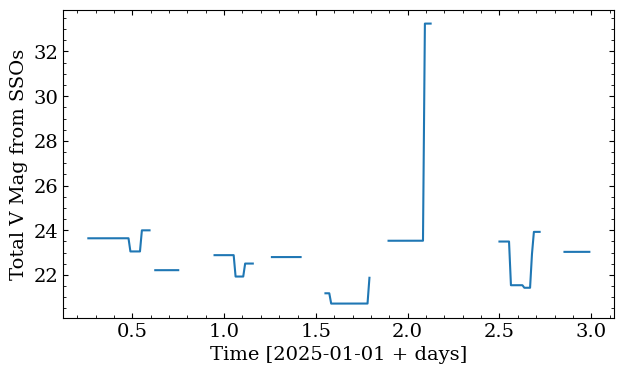

In [6]:
fig, ax = plt.subplots()
ax.plot(np.arange(0, 3, 1 / 24 / 4), total_mags)
ax.set(xlabel="Time [2025-01-01 + days]", ylabel="Total V Mag from SSOs");

This shows us that although the separation might have been small, the magnitude of the object was very faint, and so it likely had little impact on our lightcurve. The gaps here correspond to times when nothing fell within our search radius, meaning the magnitude was technially $\infty$. Finally, for fun and a sanity check, we can animate what was happening in the sky using the outputs of the above function:

In [7]:
anim = animate_region(
    coordinate=SkyCoord(ra=0 * u.deg, dec=0 * u.deg),
    times=Time("2025-01-01") + np.arange(0, 3, 1 / 24 / 4) * u.day,
    coord_table=coord_table,
    radius=2 * u.arcmin
)

This *should* render within a notebook, but can also be saved as a gif via something like:
```python
ani.save('animation.gif', writer='pillow')
```

In [2]:
from jorbit.mpchecker import nearest_asteroid_helper